In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

-----
anndata     0.8.0
scanpy      1.9.1
-----
PIL                         9.2.0
PyObjCTools                 NA
appnope                     0.1.2
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
bottleneck                  1.3.5
cffi                        1.15.1
cloudpickle                 2.0.0
colorama                    0.4.5
cycler                      0.10.0
cython_runtime              NA
cytoolz                     0.11.0
dask                        2022.7.0
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
defusedxml                  0.7.1
entrypoints                 0.4
fsspec                      2022.7.1
google                      NA
h5py                        3.7.0
hypergeom_ufunc             NA
igraph                      0.10.1
ipykernel                   6.15.2
ipython_genutils            0.2.0
ipywidgets                  7.6.5
jedi                        0.18.1
jinja2  

In [3]:
#Using Visium spatial transcriptomics dataset of the human lymphnode
adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

  0%|          | 0.00/7.86M [00:00<?, ?B/s]

  0%|          | 0.00/29.3M [00:00<?, ?B/s]

reading /Users/denverncube/data/V1_Human_Lymph_Node/filtered_feature_bc_matrix.h5
 (0:00:01)


/Users/denverncube/opt/anaconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
#check the data structure
adata

AnnData object with n_obs × n_vars = 4035 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

<AxesSubplot:xlabel='n_genes_by_counts', ylabel='Count'>

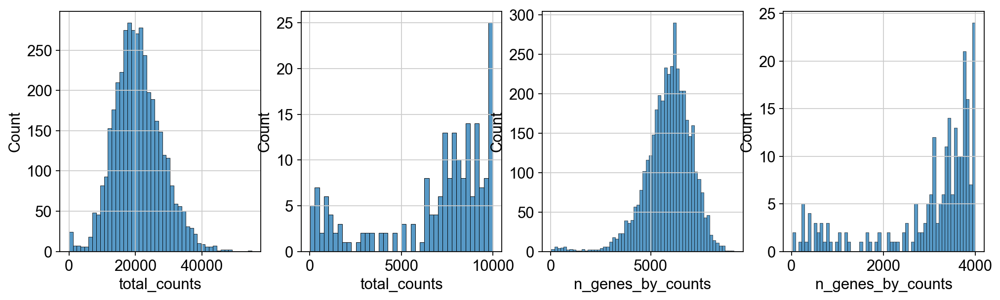

In [9]:
#Using hist plots to visualize data
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(adata.obs["total_counts"][adata.obs["total_counts"] < 10000], kde=False, bins=40, ax=axs[1])
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000], kde=False, bins=60, ax=axs[3])

In [10]:
#Filter out cells that have less than 5000 counts and those that have more than 35000 counts
sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] < 20]
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

filtered out 44 cells that have less than 5000 counts
filtered out 130 cells that have more than 35000 counts
#cells after MT filter: 3861
filtered out 16916 genes that are detected in less than 10 cells


/Users/denverncube/opt/anaconda3/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:251: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


In [11]:
#Normalization of Visium counts data using the built-in method from ScanPy
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [12]:
#Manifold embedding and clustering based on transcriptional similarity
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters")

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)
running Leiden clustering
    finished: found 10 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


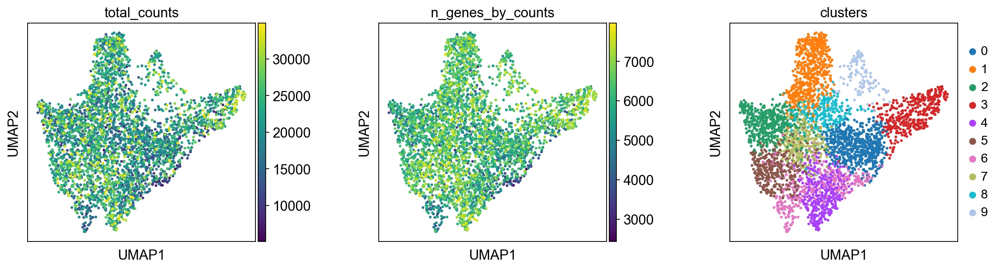

In [13]:
#I plot some covariates to check if there is any particular structure in the UMAP associated with total counts and detected genes
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

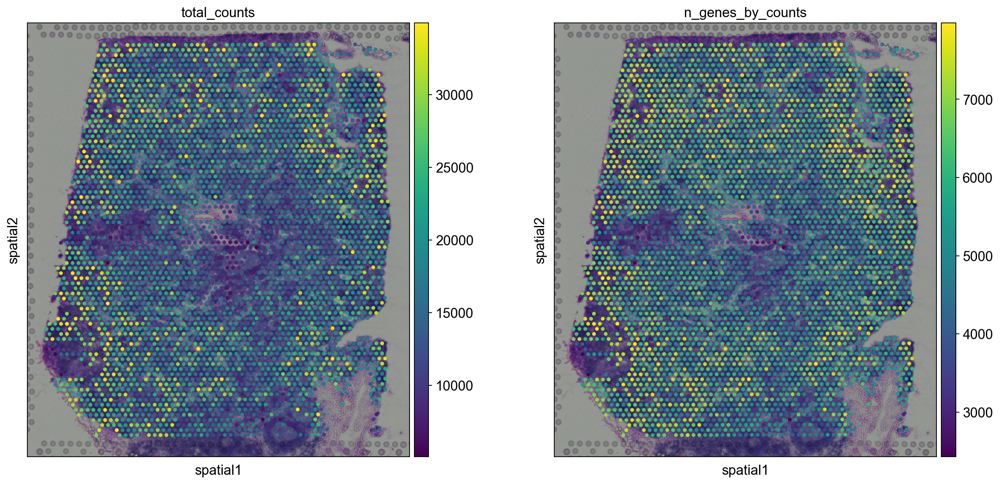

In [14]:
#Visualization in spatial coordinates
#Let us now take a look at how total_counts and n_genes_by_counts behave in spatial coordinates. We will overlay the circular spots on top of the Hematoxylin and eosin stain (H&E) image provided, using the function sc.pl.spatial.
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])


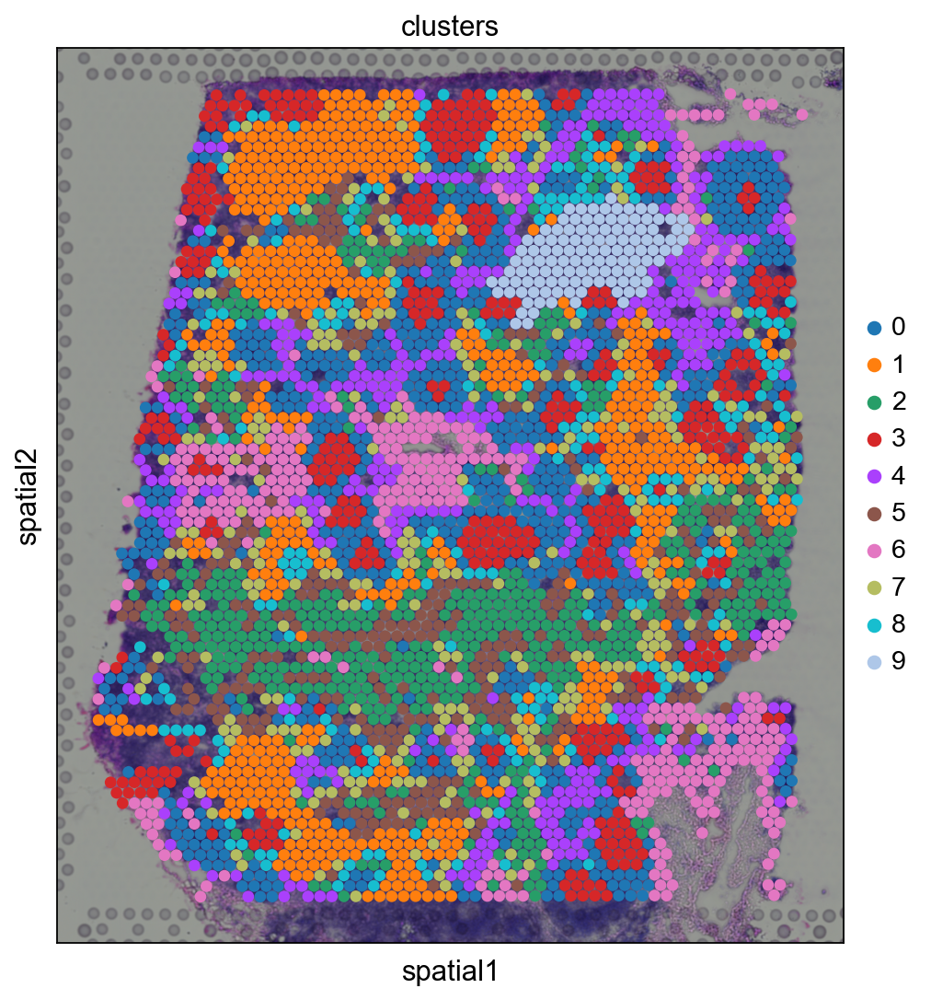

In [15]:
#Before, we performed clustering in gene expression space, and visualized the results with UMAP. By visualizing clustered samples in spatial dimensions, we can gain insights into tissue organization and, potentially, into inter-cellular communication.
sc.pl.spatial(adata, img_key="hires", color="clusters", size=1.5)



/Users/denverncube/opt/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


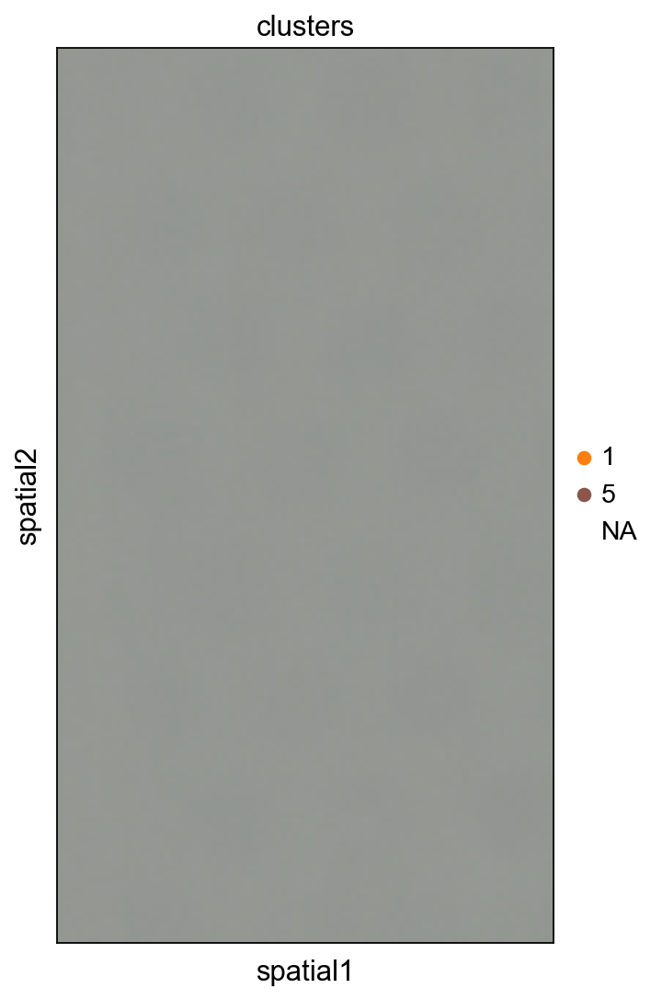

In [20]:
#Spots belonging to the same cluster in gene expression space often co-occur
#in spatial dimensions For instance spots belonging to cluster 5 are often 
#surrounded by spots belonging to cluster 0
sc.pl.spatial(adata, img_key="hires", color="clusters", groups=["0", "5"], crop_coord=[1200, 1700, 1900, 1000], alpha=0.5, size=1.3)


ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clusters']`
categories: 0, 1, 2, etc.
var_group_labels: 5


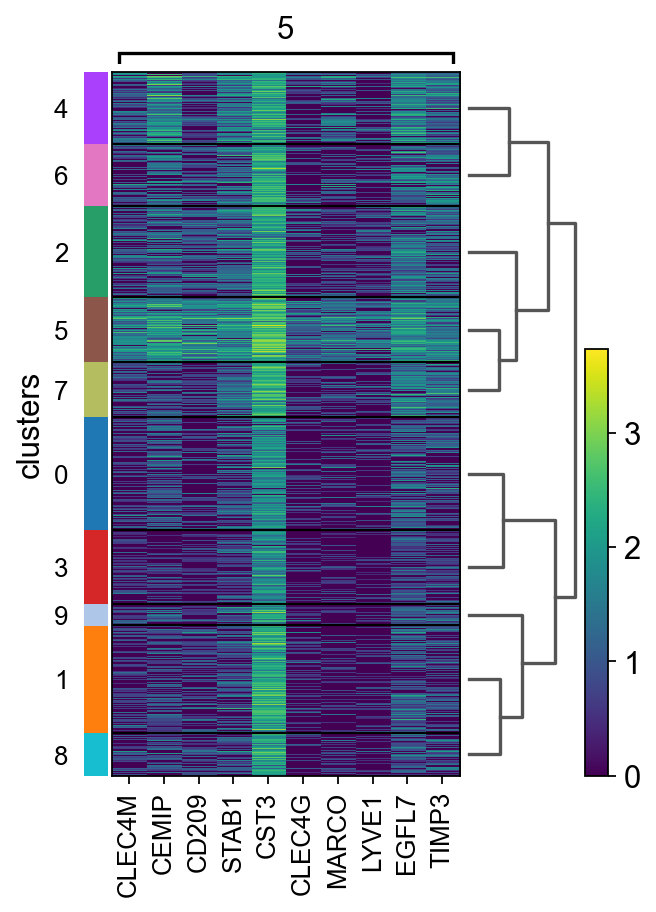

In [19]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata, groups="5", n_genes=10, groupby="clusters")

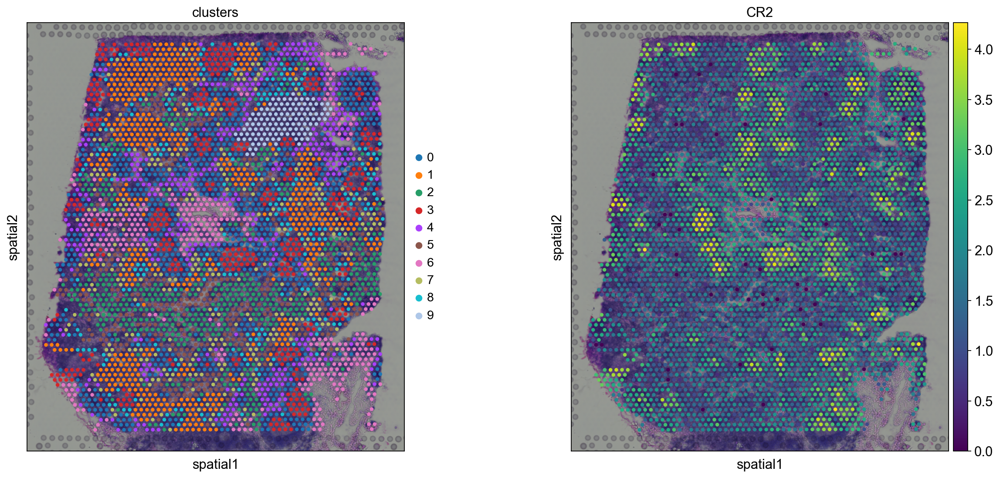

In [21]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "CR2"])


In [25]:
#Spatially variable genes
import sys
!{sys.executable} -m pip install spatialde


  Preparing metadata (setup.py) ... done
  Created wheel for NaiveDE: filename=NaiveDE-1.2.0-py3-none-any.whl size=5688 sha256=8c61d34e645524dd293064e02d702a48d29b2775676ce71feba3c4922e50ffcb
  Stored in directory: /Users/denverncube/Library/Caches/pip/wheels/82/8e/4e/dd6448962915d382128e962215e43abb69f8f1ab24adb98825
Successfully built NaiveDE


In [32]:
import SpatialDE



In [33]:
%time
counts = pd.DataFrame(adata.X.todense(), columns=adata.var_names, index=adata.obs_names)
coord = pd.DataFrame(adata.obsm['spatial'], columns=['x_coord', 'y_coord'], index=adata.obs_names)
results = SpatialDE.run(coord, counts)

CPU times: user 3 µs, sys: 1e+03 ns, total: 4 µs
Wall time: 8.11 µs


/Users/denverncube/opt/anaconda3/lib/python3.9/site-packages/SpatialDE/base.py:26: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  R2 = -2. * np.dot(X, X.T) + (Xsq[:, None] + Xsq[None, :])
/Users/denverncube/opt/anaconda3/lib/python3.9/site-packages/SpatialDE/base.py:40: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  R2 = -2. * np.dot(X, X.T) + (Xsq[:, None] + Xsq[None, :])


Models:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

/Users/denverncube/opt/anaconda3/lib/python3.9/site-packages/SpatialDE/base.py:178: RuntimeWarning: divide by zero encountered in double_scalars
  s2_logdelta = 1. / (derivative(LL_obj, np.log(max_delta), n=2) ** 2)


  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

  0%|          | 0/19685 [00:00<?, ?it/s]

In [35]:
#We concetenate the results of the DataFrame of annotations of variables: adata.var
results.index = results["g"]
adata.var = pd.concat([adata.var, results.loc[adata.var.index.values, :]], axis=1)


In [36]:
#Then we can inspect significant genes that varies in space and visualize them with sc.pl.spatial function.
results.sort_values("qval").head(10)

,FSV,M,g,l,max_delta,max_ll,max_mu_hat,max_s2_t_hat,model,n,s2_FSV,s2_logdelta,time,BIC,max_ll_null,LLR,pval,qval
g,,,,,,,,,,,,,,,,,,
CD8B,0.088647,4,CD8B,474.158722,10.083471,-1994.883236,0.280102,0.016554,SE,3861,1.121435e-05,0.001472,0.007568,4022.801199,-2076.465163,81.581926,0.0,0.0
GREM1,0.160466,4,GREM1,248.797504,5.203951,-2993.402340,0.548066,0.058961,SE,3861,6.565188e-06,0.000344,0.006763,6019.839405,-3108.399994,114.997654,0.0,0.0
SAMD9L,0.113797,4,SAMD9L,474.158722,7.638217,-3050.518947,0.685891,0.041350,SE,3861,7.461739e-06,0.000654,0.004191,6134.072620,-3240.107551,189.588603,0.0,0.0
TESPA1,0.083160,4,TESPA1,474.158722,10.813533,-2879.941524,0.548796,0.026746,SE,3861,1.113220e-05,0.001626,0.015684,5792.917775,-2956.674466,76.732941,0.0,0.0
IGHM,0.549000,4,IGHM,248.797504,0.817109,-1404.900196,4.412324,1.037201,SE,3861,2.635308e-06,0.000050,0.004306,2842.835117,-2464.120125,1059.219930,0.0,0.0
IGHD,0.221952,4,IGHD,248.797504,3.486772,-3201.847990,1.350073,0.151777,SE,3861,3.930682e-06,0.000135,0.005108,6436.730705,-3450.873927,249.025938,0.0,0.0
IGHG3,0.717894,4,IGHG3,248.797504,0.390866,-2037.617424,4.865079,1.440950,SE,3861,1.471988e-06,0.000039,0.004652,4108.269575,-3717.766627,1680.149203,0.0,0.0
IGHG1,0.787405,4,IGHG1,248.797504,0.268554,-1496.384298,4.437176,1.261307,SE,3861,8.924700e-07,0.000032,0.005059,3025.803322,-3703.575915,2207.191617,0.0,0.0
IGHA1,0.573918,4,IGHA1,248.797504,0.738449,-2542.307067,3.858365,0.925555,SE,3861,2.911812e-06,0.000056,0.004278,5117.648860,-3464.440659,922.133592,0.0,0.0


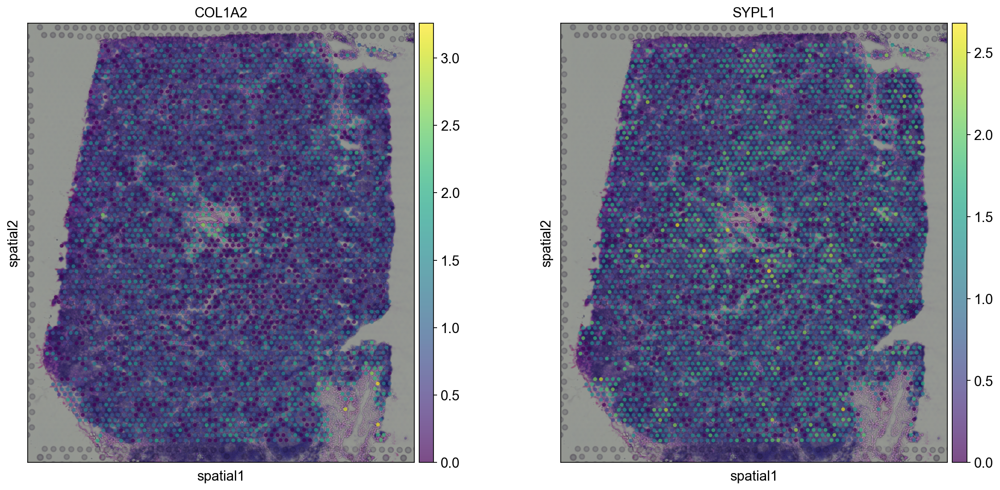

In [37]:
sc.pl.spatial(adata, img_key="hires", color=["COL1A2", "SYPL1"], alpha=0.7)
